In [2]:
import random
from pathlib import Path
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image, ImageFile

from sklearn.metrics import confusion_matrix, accuracy_score

import matplotlib.pyplot as plt

ImageFile.LOAD_TRUNCATED_IMAGES = True


In [3]:
CONFIG = {
    "img_size": 224,
    "batch_size": 32,
    "epochs": 50,            # max epochs (early stopping will stop earlier)
    "lr": 3e-4,              # more stable than 1e-3 for AdamW
    "weight_decay": 1e-4,
    "seed": 42,
    "val_size": 0.15,
    "test_size": 0.15,
    "num_workers": 0,        # Windows safe default

    # training control
    "patience": 7,           # early stopping patience
    "min_delta": 1e-4,       # minimum val_loss improvement
    "min_epochs": 5,         # warmup before early stopping
    "clip_grad_norm": 1.0,   # gradient clipping
}

def set_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(CONFIG["seed"])

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

CONFIG


Device: cpu


{'img_size': 224,
 'batch_size': 32,
 'epochs': 50,
 'lr': 0.0003,
 'weight_decay': 0.0001,
 'seed': 42,
 'val_size': 0.15,
 'test_size': 0.15,
 'num_workers': 0,
 'patience': 7,
 'min_delta': 0.0001,
 'min_epochs': 5,
 'clip_grad_norm': 1.0}

In [4]:
DATA_DIR = Path("data")
SPLITS_DIR = DATA_DIR / "splits"

RQ1_OUT = Path("outputs") / "rq1"
RQ5_OUT = Path("outputs") / "rq5"
(RQ5_OUT / "universal").mkdir(parents=True, exist_ok=True)

# From NEW RQ1 pipeline (train/val only + unseen test indexes)
usd_train_csv = SPLITS_DIR / "usd_train.csv"
usd_val_csv   = SPLITS_DIR / "usd_val.csv"
usd_unseen_csv = SPLITS_DIR / "usd_unseen_test.csv"

thb_train_csv = SPLITS_DIR / "thb_train.csv"
thb_val_csv   = SPLITS_DIR / "thb_val.csv"
thb_unseen_csv = SPLITS_DIR / "thb_unseen_test.csv"

print("Found USD split files:", usd_train_csv.exists(), usd_val_csv.exists(), usd_unseen_csv.exists())
print("Found THB split files:", thb_train_csv.exists(), thb_val_csv.exists(), thb_unseen_csv.exists())
print("RQ5 outputs:", RQ5_OUT.resolve())


Found USD split files: True True True
Found THB split files: True True True
RQ5 outputs: C:\Users\brand\Downloads\ML_Currency_Detection\outputs\rq5


In [5]:
usd_train = pd.read_csv(usd_train_csv)
usd_val   = pd.read_csv(usd_val_csv)
usd_unseen = pd.read_csv(usd_unseen_csv)

thb_train = pd.read_csv(thb_train_csv)
thb_val   = pd.read_csv(thb_val_csv)
thb_unseen = pd.read_csv(thb_unseen_csv)

for name, df in [("usd_train", usd_train), ("usd_val", usd_val), ("usd_unseen", usd_unseen),
                 ("thb_train", thb_train), ("thb_val", thb_val), ("thb_unseen", thb_unseen)]:
    assert "path" in df.columns and "label" in df.columns, f"{name} must have columns: path, label"
    assert len(df) > 0, f"{name} is empty"
    assert df["path"].map(lambda p: Path(p).exists()).all(), f"{name} contains missing file paths"

print("Loaded train/val + unseen test indexes")


Loaded train/val + unseen test indexes


In [6]:
def add_currency_prefix(df: pd.DataFrame, currency: str) -> pd.DataFrame:
    out = df.copy()
    out["currency"] = currency
    out["u_label"] = out["label"].apply(lambda x: f"{currency}__{x}")
    return out

usd_train_u = add_currency_prefix(usd_train, "USD")
usd_val_u   = add_currency_prefix(usd_val, "USD")
usd_unseen_u = add_currency_prefix(usd_unseen, "USD")

thb_train_u = add_currency_prefix(thb_train, "THB")
thb_val_u   = add_currency_prefix(thb_val, "THB")
thb_unseen_u = add_currency_prefix(thb_unseen, "THB")

u_train = pd.concat([usd_train_u, thb_train_u], ignore_index=True)
u_val   = pd.concat([usd_val_u,   thb_val_u],   ignore_index=True)

print("Universal train size:", len(u_train))
print("Universal val size:", len(u_val))
u_train.head()


Universal train size: 1120
Universal val size: 480


,path,currency,label,u_label
0,data\USD\5 Dollar\5_Dollar_061.jpg,USD,5 Dollar,USD__5 Dollar
1,data\USD\10 Dollar\10_Dollar_024.jpg,USD,10 Dollar,USD__10 Dollar
2,data\USD\50 Dollar\50_Dollar_115.jpg,USD,50 Dollar,USD__50 Dollar
3,data\USD\10 Dollar\10_Dollar_068.jpg,USD,10 Dollar,USD__10 Dollar
4,data\USD\50 Dollar\50_Dollar_011.jpg,USD,50 Dollar,USD__50 Dollar


In [7]:
train_tfms = transforms.Compose([
    transforms.Resize((CONFIG["img_size"], CONFIG["img_size"])),
    transforms.RandomRotation(180),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

eval_tfms = transforms.Compose([
    transforms.Resize((CONFIG["img_size"], CONFIG["img_size"])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


In [8]:
class CurrencyDataset(torch.utils.data.Dataset):
    def __init__(self, df: pd.DataFrame, label_col: str, class_to_idx: dict, tfms):
        self.df = df.reset_index(drop=True)
        self.label_col = label_col
        self.class_to_idx = class_to_idx
        self.tfms = tfms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        row = self.df.iloc[idx]
        img = Image.open(row["path"]).convert("RGB")
        x = self.tfms(img)
        y = self.class_to_idx[row[self.label_col]]
        return x, y

def make_loaders(df_train, df_val, label_col: str):
    classes = sorted(df_train[label_col].unique())
    class_to_idx = {c: i for i, c in enumerate(classes)}
    idx_to_class = {i: c for c, i in class_to_idx.items()}

    train_ds = CurrencyDataset(df_train, label_col, class_to_idx, train_tfms)
    val_ds   = CurrencyDataset(df_val,   label_col, class_to_idx, eval_tfms)

    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True,  num_workers=CONFIG["num_workers"])
    val_loader   = DataLoader(val_ds,   batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

    return train_loader, val_loader, class_to_idx, idx_to_class

u_train_loader, u_val_loader, u_class_to_idx, u_idx_to_class = make_loaders(u_train, u_val, label_col="u_label")
print("Universal #classes:", len(u_class_to_idx))


Universal #classes: 10


In [9]:
def build_model(num_classes: int):
    model = resnet50(weights=ResNet50_Weights.DEFAULT)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model.to(device)


In [10]:
def train_universal_best_val_loss(
    train_loader,
    val_loader,
    num_classes: int,
    patience: int = 5,
    min_delta: float = 0.0,
):
    model = build_model(num_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=CONFIG["lr"],
        weight_decay=CONFIG["weight_decay"]
    )

    best_val_loss = float("inf")
    best_state = None
    history = []

    epochs_no_improve = 0

    for epoch in range(1, CONFIG["epochs"] + 1):
        # ---- Train ----
        model.train()
        train_loss_sum, train_correct, train_total = 0.0, 0, 0

        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad(set_to_none=True)
            logits = model(x)
            loss = criterion(logits, y)
            loss.backward()
            optimizer.step()

            bs = y.size(0)
            train_loss_sum += loss.item() * bs
            train_correct += (logits.argmax(1) == y).sum().item()
            train_total += bs

        train_loss = train_loss_sum / train_total
        train_acc = train_correct / train_total

        # ---- Val ----
        model.eval()
        val_loss_sum, val_correct, val_total = 0.0, 0, 0

        with torch.no_grad():
            for x, y in val_loader:
                x, y = x.to(device), y.to(device)
                logits = model(x)
                loss = criterion(logits, y)

                bs = y.size(0)
                val_loss_sum += loss.item() * bs
                val_correct += (logits.argmax(1) == y).sum().item()
                val_total += bs

        val_loss = val_loss_sum / val_total
        val_acc = val_correct / val_total

        history.append({
            "epoch": epoch,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "val_loss": val_loss,
            "val_acc": val_acc
        })

        print(
            f"Epoch {epoch:02d} | "
            f"train_acc={train_acc:.4f} val_acc={val_acc:.4f} val_loss={val_loss:.4f}"
        )

        # save BEST by lowest val loss (with min_delta threshold)
        if val_loss < best_val_loss - min_delta:
            best_val_loss = val_loss
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        # Early stopping
        if epochs_no_improve >= patience:
            print(
                f"Early stopping at epoch {epoch:02d} "
                f"(no val_loss improvement for {patience} epochs). "
                f"Best val_loss={best_val_loss:.4f}"
            )
            break

    # load best checkpoint
    if best_state is not None:
        model.load_state_dict(best_state)

    return model, pd.DataFrame(history), best_val_loss


In [11]:
def make_test_loader(df_test_u: pd.DataFrame, label_col: str, class_to_idx: dict):
    test_ds = CurrencyDataset(df_test_u, label_col, class_to_idx, eval_tfms)
    test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
    return test_loader

usd_unseen_loader_u = make_test_loader(usd_unseen_u, "u_label", u_class_to_idx)
thb_unseen_loader_u = make_test_loader(thb_unseen_u, "u_label", u_class_to_idx)

print("USD unseen test batches:", len(usd_unseen_loader_u))
print("THB unseen test batches:", len(thb_unseen_loader_u))


USD unseen test batches: 7
THB unseen test batches: 7


In [12]:
u_model, u_hist, best_val_loss = train_universal_best_val_loss(
    u_train_loader, u_val_loader, num_classes=len(u_class_to_idx)
)

print("Best val loss:", best_val_loss)

u_hist.to_csv(RQ5_OUT / "universal" / "history.csv", index=False)
torch.save(u_model.state_dict(), RQ5_OUT / "universal" / "best_by_val_loss.pt")
u_hist.tail()


Epoch 01 | train_acc=0.5804 val_acc=0.8729 val_loss=0.3728
Epoch 02 | train_acc=0.9187 val_acc=0.9500 val_loss=0.2036
Epoch 03 | train_acc=0.9518 val_acc=0.9688 val_loss=0.1014
Epoch 04 | train_acc=0.9732 val_acc=0.9667 val_loss=0.0902
Epoch 05 | train_acc=0.9795 val_acc=0.9896 val_loss=0.0447
Epoch 06 | train_acc=0.9920 val_acc=0.9604 val_loss=0.1112
Epoch 07 | train_acc=0.9804 val_acc=0.9563 val_loss=0.1366
Epoch 08 | train_acc=0.9777 val_acc=0.9875 val_loss=0.0702
Epoch 09 | train_acc=0.9857 val_acc=0.9917 val_loss=0.0583
Epoch 10 | train_acc=0.9857 val_acc=0.9854 val_loss=0.0697
Early stopping at epoch 10 (no val_loss improvement for 5 epochs). Best val_loss=0.0447
Best val loss: 0.044689433804402746


,epoch,train_loss,train_acc,val_loss,val_acc
5,6,0.036424,0.991964,0.111207,0.960417
6,7,0.059988,0.980357,0.136551,0.956250
7,8,0.070663,0.977679,0.070169,0.987500
8,9,0.047259,0.985714,0.058309,0.991667
9,10,0.060265,0.985714,0.069687,0.985417


In [16]:
def evaluate_universal(model, test_loader, idx_to_class):
    model.eval()
    all_true, all_pred = [], []

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            logits = model(x)
            preds = logits.argmax(1).cpu().numpy()
            all_pred.extend(preds)
            all_true.extend(y.numpy())

    all_true = np.array(all_true)
    all_pred = np.array(all_pred)

    acc = accuracy_score(all_true, all_pred)

    all_label_ids = list(range(len(idx_to_class)))
    cm = confusion_matrix(all_true, all_pred, labels=all_label_ids)

    per_class = []
    for i in all_label_ids:
        row_sum = cm[i].sum()
        class_acc = (cm[i, i] / row_sum) if row_sum > 0 else np.nan
        per_class.append({"class": idx_to_class[i], "acc": class_acc})

    per_class_df = pd.DataFrame(per_class).sort_values("acc")
    macro_all = float(np.nanmean(per_class_df["acc"]))
    return acc, macro_all, cm, per_class_df

u_usd_acc, u_usd_macro_all, u_usd_cm, u_usd_per_class = evaluate_universal(u_model, usd_unseen_loader_u, u_idx_to_class)
u_thb_acc, u_thb_macro_all, u_thb_cm, u_thb_per_class = evaluate_universal(u_model, thb_unseen_loader_u, u_idx_to_class)

print("Universal on USD unseen test:", u_usd_acc, "| macro(all):", u_usd_macro_all)
print("Universal on THB unseen test:", u_thb_acc, "| macro(all):", u_thb_macro_all)


Universal on USD unseen test: 1.0 | macro(all): 1.0
Universal on THB unseen test: 0.975 | macro(all): 0.975


In [17]:
def macro_for_currency(per_class_df, currency_prefix):
    sub = per_class_df[per_class_df["class"].str.startswith(currency_prefix + "__")]
    return float(np.nanmean(sub["acc"]))

u_usd_macro = macro_for_currency(u_usd_per_class, "USD")
u_thb_macro = macro_for_currency(u_thb_per_class, "THB")

print("Universal macro (USD classes only):", u_usd_macro)
print("Universal macro (THB classes only):", u_thb_macro)


Universal macro (USD classes only): 1.0
Universal macro (THB classes only): 0.975


In [24]:
rq1_summary_path = RQ1_OUT / "rq1_summary_latest.csv"
rq1_summary_path.parent.mkdir(parents=True, exist_ok=True)

rq1_summary = pd.DataFrame([
    {"currency": "USD", "model": "Universal (Joint)", "test_accuracy": 1.00, "macro_per_class_acc": 1.00},
    {"currency": "THB", "model": "Universal (Joint)", "test_accuracy": 0.97, "macro_per_class_acc": 0.97},
])

rq1_summary.to_csv(rq1_summary_path, index=False)
display(rq1_summary)
print("Saved:", rq1_summary_path)


,currency,model,test_accuracy,macro_per_class_acc
0,USD,Universal (Joint),1.00,1.00
1,THB,Universal (Joint),0.97,0.97


Saved: outputs\rq1\rq1_summary_latest.csv


In [30]:
# Paths / output folder
RQ5_OUT = Path("outputs") / "rq5"
RQ5_OUT.mkdir(parents=True, exist_ok=True)

rq1 = rq1_summary.copy()

if "currency" not in rq1.columns:
    raise ValueError(
        f"rq1_summary must contain a 'currency' column.\n"
        f"Available columns: {list(rq1.columns)}"
    )

# Ensure model exists
if "model" not in rq1.columns:
    rq1["model"] = "Baseline (Separate)"

# Ensure required metric columns exist 
if "test_accuracy" not in rq1.columns:
    for alt in ["test_acc", "accuracy", "acc", "test_accuracy_mean"]:
        if alt in rq1.columns:
            rq1["test_accuracy"] = rq1[alt]
            break

if "macro_per_class_acc" not in rq1.columns:
    for alt in ["macro_acc", "macro_accuracy", "macro_per_class_accuracy", "macro_avg_acc"]:
        if alt in rq1.columns:
            rq1["macro_per_class_acc"] = rq1[alt]
            break

# Final check
needed = ["currency", "model", "test_accuracy", "macro_per_class_acc"]
missing = [c for c in needed if c not in rq1.columns]
if missing:
    raise ValueError(
        f"rq1_summary is missing required columns: {missing}\n"
        f"Available columns: {list(rq1.columns)}"
    )

rq1 = rq1[needed]

# RQ5 universal (joint) results
rq5_rows = pd.DataFrame([
    {
        "currency": "USD",
        "model": "Universal (joint)",
        "test_accuracy": float(u_usd_acc),
        "macro_per_class_acc": float(u_usd_macro),
    },
    {
        "currency": "THB",
        "model": "Universal (joint)",
        "test_accuracy": float(u_thb_acc),
        "macro_per_class_acc": float(u_thb_macro),
    },
])

# Combine + save
rq5_compare = pd.concat([rq1, rq5_rows], ignore_index=True)

rq5_compare_path = RQ5_OUT / "rq5_comparison.csv"
rq5_compare.to_csv(rq5_compare_path, index=False)

display(rq5_compare)
print("Saved to:", rq5_compare_path.resolve())

,currency,model,test_accuracy,macro_per_class_acc
0,USD,Baseline (Separate),1.000,1.000
1,THB,Baseline (Separate),0.970,0.970
2,USD,Universal (joint),1.000,1.000
3,THB,Universal (joint),0.975,0.975


Saved to: C:\Users\brand\Downloads\ML_Currency_Detection\outputs\rq5\rq5_comparison.csv


In [31]:
def filter_per_class(per_class_df, currency_prefix):
    out = per_class_df.copy()
    out = out[out["class"].str.startswith(currency_prefix + "__")].copy()
    out["class"] = out["class"].str.replace(currency_prefix + "__", "", regex=False)
    return out.sort_values("acc")

u_usd_per_class_small = filter_per_class(u_usd_per_class, "USD")
u_thb_per_class_small = filter_per_class(u_thb_per_class, "THB")

u_usd_per_class_small.to_csv(RQ5_OUT / "universal" / "per_class_usd.csv", index=False)
u_thb_per_class_small.to_csv(RQ5_OUT / "universal" / "per_class_thb.csv", index=False)

print("USD hardest classes (Universal):")
display(u_usd_per_class_small.head(5))

print("THB hardest classes (Universal):")
display(u_thb_per_class_small.head(5))


USD hardest classes (Universal):


,class,acc
5,10 Dollar,1.0
6,100 Dollar,1.0
7,2 Dollar,1.0
8,5 Dollar,1.0
9,50 Dollar,1.0


THB hardest classes (Universal):


,class,acc
3,THAI50,0.950
0,THAI100,0.975
1,THAI1000,0.975
4,THAI500,0.975
2,THAI20,1.000


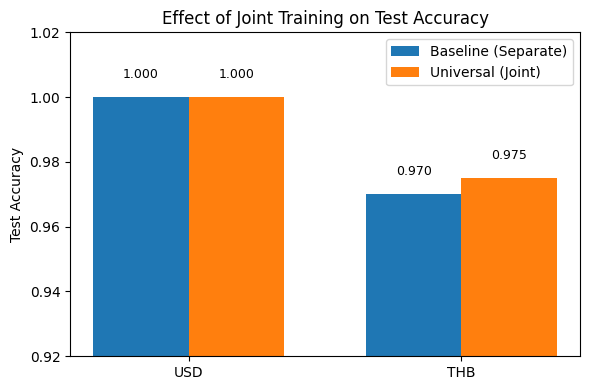

In [35]:
labels = ["USD", "THB"]
baseline_acc = [1.00, 0.97]
universal_acc = [1.00, 0.975]


x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(6,4))
b1 = plt.bar(x - width/2, baseline_acc, width, label="Baseline (Separate)")
b2 = plt.bar(x + width/2, universal_acc, width, label="Universal (Joint)")

plt.xticks(x, labels)
plt.ylabel("Test Accuracy")

# dynamic y-limits
all_vals = np.array(baseline_acc + universal_acc)
ymin = max(0.0, all_vals.min() - 0.05)
ymax = min(1.02, all_vals.max() + 0.02)
plt.ylim(ymin, ymax)

plt.title("Effect of Joint Training on Test Accuracy")
plt.legend()

# add value labels
for bars in (b1, b2):
    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.005,
            f"{h:.3f}",   # 3 dp
            ha="center",
            va="bottom",
            fontsize=9
        )


plt.tight_layout()
plt.show()


Universal model: Unseen USD banknotes


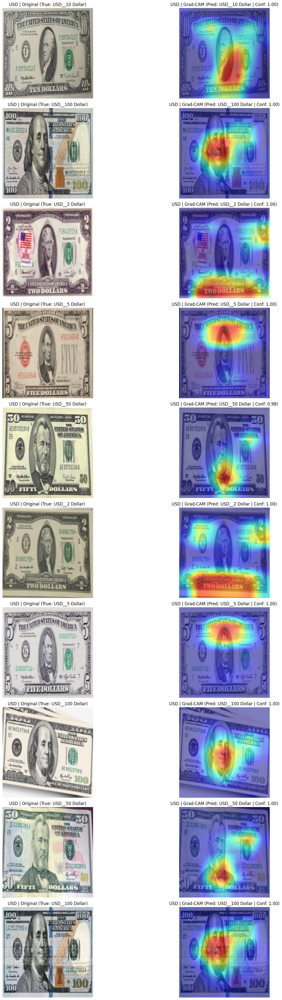

Universal model: Unseen THB banknotes


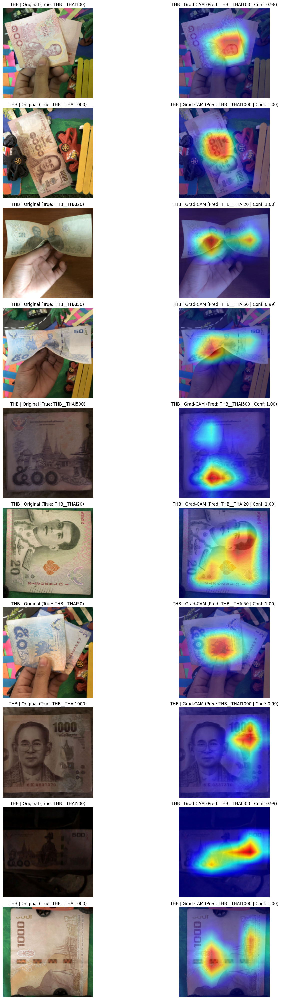

In [46]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt

# --- helper ---
def denormalize_image(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = tensor.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

def visualize_gradcam_joint(model, loader, idx_to_class, device, num_images=10, seed=0, title_prefix=""):
    model.eval()
    torch.manual_seed(seed)

    target_layers = [model.layer4[-1]]
    cam = GradCAM(model=model, target_layers=target_layers)

    # Collect all images/labels from loader
    all_images, all_labels = [], []
    for batch_images, batch_labels in loader:
        all_images.append(batch_images)
        all_labels.append(batch_labels)

    images = torch.cat(all_images, dim=0)
    labels = torch.cat(all_labels, dim=0)

    # Sample with class diversity (1 per class, then fill randomly)
    class_to_indices = {}
    for i, y in enumerate(labels):
        class_to_indices.setdefault(int(y.item()), []).append(i)

    selected_indices = []
    for class_id in sorted(class_to_indices.keys()):
        if len(selected_indices) >= num_images:
            break
        idx = class_to_indices[class_id][torch.randint(0, len(class_to_indices[class_id]), (1,)).item()]
        selected_indices.append(idx)

    if len(selected_indices) < num_images:
        remaining = num_images - len(selected_indices)
        extra = torch.randperm(len(labels))[:remaining].tolist()
        selected_indices.extend(extra)

    plt.figure(figsize=(18, 4 * len(selected_indices)))

    for plot_idx, img_idx in enumerate(selected_indices):
        input_tensor = images[img_idx].unsqueeze(0).to(device)

        with torch.no_grad():
            logits = model(input_tensor)
            pred_idx = int(logits.argmax(dim=1).item())
            confidence = float(torch.softmax(logits, dim=1).max().item())

        true_id = int(labels[img_idx].item())
        true_label = idx_to_class.get(true_id, str(true_id))
        pred_label = idx_to_class.get(pred_idx, str(pred_idx))

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        rgb_img = denormalize_image(images[img_idx])
        overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        # Original
        plt.subplot(len(selected_indices), 2, 2 * plot_idx + 1)
        plt.imshow(rgb_img)
        plt.title(f"{title_prefix}Original (True: {true_label})")
        plt.axis("off")

        # Grad-CAM
        plt.subplot(len(selected_indices), 2, 2 * plot_idx + 2)
        plt.imshow(overlay)
        plt.title(f"{title_prefix}Grad-CAM (Pred: {pred_label} | Conf: {confidence:.2f})")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# --- RUN IT (UNIVERSAL / JOINT MODEL) ---

print("Universal model: Unseen USD banknotes")
visualize_gradcam_joint(
    u_model,
    usd_unseen_loader_u,     
    u_idx_to_class,          
    device,
    num_images=10,
    title_prefix="USD | "
)

print("Universal model: Unseen THB banknotes")
visualize_gradcam_joint(
    u_model,
    thb_unseen_loader_u,     
    u_idx_to_class,          
    device,
    num_images=10,
    title_prefix="THB | "
)
